<div>
<img src=https://www.institutedata.com/wp-content/uploads/2019/10/iod_h_tp_primary_c.svg width="300">
</div>

# Mini Project 3
# Automated Car Damage Detection for Insurance Claims

## Business problem
Manual car damage assessment in insurance claims is inefficient, inconsistent, and prone to errors, leading to delays, higher costs, and increased risk of fraud. Automating damage detection with an image classification model can streamline the claims process, improve accuracy, and ensure consistent assessments. This will reduce operational costs, expedite claim settlements, and enhance customer satisfaction by enabling faster, more reliable decision-making.

## Dataset
The dataset contains approximately 1,500 unique RGB images with the dimensions 224 x 224 pixels., labeled 8 categories. Note that the unknown class contains images of cars that are in either pristine or wrecked condition.

It has the classes:
- bumper_dent
- bumper_scratch
- door_dent
- door_scratch
- glass_shatter
- head_lamp
- tail_lamp
- unknown

## Import libraries

In [1]:
# Uncomment the statements below if there are problems with TensorFlow on macOS
import os
os.environ['KMP_DUPLICATE_LIB_OK'] = 'True'

In [2]:
## Import libraries
import pandas as pd
import numpy as np
import seaborn as sns

%matplotlib inline
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split

from sklearn.metrics import confusion_matrix

import warnings
warnings.filterwarnings('ignore')

In [3]:
# Uncomment the statement below to allow online monitoring with TensorBoard (need to be installed)
from keras.callbacks import TensorBoard

In [4]:
# import tensorflow and keras
import tensorflow
from tensorflow import keras

from tensorflow.keras.preprocessing.image import ImageDataGenerator

from keras.layers import Conv2D
from keras.layers import Dense
from keras.layers import Dropout
from keras.layers import Flatten
from keras.layers import MaxPool2D
from keras.models import Sequential
from keras.utils import to_categorical

In [5]:
import keras
print(keras.__version__)

3.8.0


In [6]:
print(tensorflow.__version__)

2.18.0


In [7]:
# Reproducibility set up

# Set random seed for numpy
np.random.seed(42)

# Set random seed for TensorFlow
tensorflow.random.set_seed(42)
tensorflow.keras.utils.set_random_seed(42) # sets seeds for base-python, numpy and tf
tensorflow.config.experimental.enable_op_determinism()

## Load data

In [8]:
data_csv = "./CarDamage/data.csv"
data = pd.read_csv(data_csv)
data.head()

,Unnamed: 0,image,classes
0,0,image/0.jpeg,unknown
1,1,image/1.jpeg,head_lamp
2,2,image/2.jpeg,door_scratch
3,3,image/3.jpeg,head_lamp
4,4,image/4.jpeg,unknown


In [9]:
# Drop column "Unnamed: 0"
data.drop(['Unnamed: 0'], axis=1, inplace=True)

In [10]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1594 entries, 0 to 1593
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   image    1594 non-null   object
 1   classes  1594 non-null   object
dtypes: object(2)
memory usage: 25.0+ KB


In [11]:
# Check null values
data.isnull().sum()

,0
image,0
classes,0


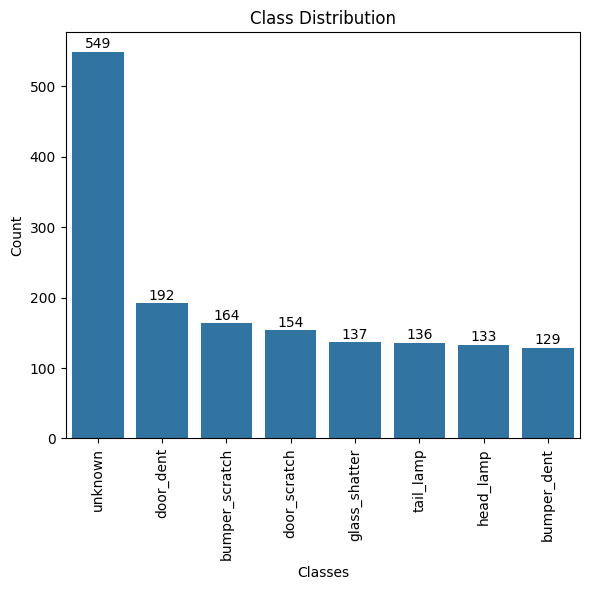

In [12]:
classes_count = data['classes'].value_counts()

# Create the barplot
plt.figure(figsize=(6, 6))
ax = sns.barplot(x=classes_count.index, y=classes_count.values)

# Add count labels on top of each bar
for i, count in enumerate(classes_count.values):
    plt.text(i, count + 0.5, str(count), ha='center', va='bottom', fontsize=10)

# Labeling
plt.xlabel('Classes')
plt.ylabel('Count')
plt.title('Class Distribution')
plt.xticks(rotation=90)

plt.tight_layout()
plt.show()

In [13]:
path = './CarDamage/'
def modify_image_path(x):
  return path + x

In [14]:
data['image'] = data['image'].apply(modify_image_path)
data.head()

,image,classes
0,./CarDamage/image/0.jpeg,unknown
1,./CarDamage/image/1.jpeg,head_lamp
2,./CarDamage/image/2.jpeg,door_scratch
3,./CarDamage/image/3.jpeg,head_lamp
4,./CarDamage/image/4.jpeg,unknown


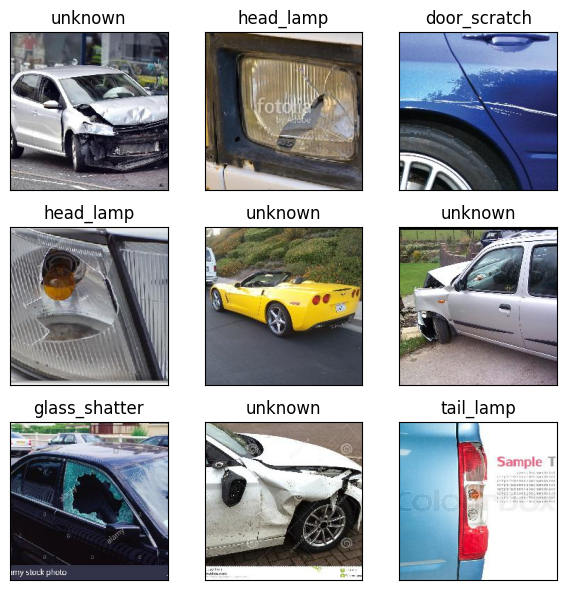

In [15]:
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(6, 6),  subplot_kw={'xticks': [], 'yticks': []})
for i, ax in enumerate(axes.flat):
  ax.imshow(plt.imread(data.image[i]))
  ax.set_title(data.classes[i])
plt.tight_layout()
plt.show()

## Train and Test Split

In [16]:
train_df, test_df = train_test_split(data, test_size=0.2)

In [17]:
train_df.shape

(1275, 2)

In [18]:
test_df.shape

(319, 2)

In [19]:
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest',
    validation_split=0.2
)

test_datagen = ImageDataGenerator(rescale=1./255)

In [20]:
train_gen = train_datagen.flow_from_dataframe(
    dataframe=train_df,
    x_col = 'image',
    y_col = 'classes',
    target_size=(224, 224),
    color_mode='rgb',
    batch_size=32,
    shuffle=True,
    seed=1
)

val_gen = train_datagen.flow_from_dataframe(
    dataframe=train_df,
    x_col = 'image',
    y_col = 'classes',
    target_size=(224, 224),
    color_mode='rgb',
    batch_size=32,
    shuffle=True,
    seed=1,
    subset='validation'
)


Found 1275 validated image filenames belonging to 8 classes.
Found 255 validated image filenames belonging to 8 classes.


In [21]:
test_gen = test_datagen.flow_from_dataframe(
    dataframe=test_df,
    x_col = 'image',
    y_col = 'classes',
    target_size=(224, 224),
    color_mode='rgb',
    class_mode='categorical',
    batch_size=32,
    shuffle=False
)

Found 319 validated image filenames belonging to 8 classes.


In [22]:
print(type(train_gen))

<class 'keras.src.legacy.preprocessing.image.DataFrameIterator'>


In [23]:
images, labels = next(train_gen)

print("Images shape:", images.shape)
print("Labels shape:", labels.shape)

Images shape: (32, 224, 224, 3)
Labels shape: (32, 8)


In [24]:
print("Total samples:", train_gen.samples)

Total samples: 1275


In [25]:
images, labels = next(test_gen)
print("Images shape:", images.shape)
print("Labels shape:", labels.shape)

Images shape: (32, 224, 224, 3)
Labels shape: (32, 8)


In [26]:
classes = (
    'bumper_dent',
    'bumper_scratch',
    'door_dent',
    'door_scratch',
    'glass_shatter',
    'head_lamp',
    'tail_lamp',
    'unknown')

## Check some data

In [27]:
def check_one(data, label, id = None, actual = None, compare = False):
  # check one
  if id is None:
    id = np.random.randint(data.shape[0])
  im = data[id]
  plt.figure(figsize=(3, 3))
  plt.imshow(im)

  l_id = label[id]
  #if (compare) and (actual is not None) and (l_id != np.argmax(actual[id])):
  if (compare) and (actual is not None):
    a_id = np.argmax(actual[id])
    #plt.title('Class %d (%s) [\u2260 %d-%s]' % (l_id, classes[l_id], a_id, classes[a_id]))
    plt.title(f"True: Class {a_id} - {classes[a_id]}\nPredicted: Class {l_id} - {classes[l_id]}")
  else:
    plt.title('Class %d (%s)' % (l_id, classes[l_id]))
  plt.xticks([])
  plt.yticks([])
  plt.show()

In [28]:
def check_ten(data, label, actual = None, compare = False):
  # check ten
  fig, ax = plt.subplots(2, 5, figsize = (16, 8))
  fig.subplots_adjust(left = 0.02, right = 0.98, top = 0.8, wspace = 0.2, hspace = 0.2)
  fig.suptitle('Check Data', fontsize = 12, fontweight = 'bold')

  plt.rcParams.update({'font.size': 10})

  ids = np.random.randint(data.shape[0], size = 10)
  r = 0
  c = 0
  for id in ids:
    im = data[id]

    # original image
    ax[r, c].imshow(im)
    l_id = label[id]
    #if (compare) and (actual is not None) and (l_id != np.argmax(actual[id])):
    if (compare) and (actual is not None):
      a_id = np.argmax(actual[id])
      #ax[r, c].set_title('Class %d (%s) [\u2260 %d-%s]' % (l_id, classes[l_id], a_id, classes[a_id]))
      ax[r, c].set_title(f"True: {classes[a_id]}\nPredicted: {classes[l_id]}")
    else:
      ax[r, c].set_title('Class %d (%s)' % (l_id, classes[l_id]))
    ax[r, c].set_xticks([])
    ax[r, c].set_yticks([])
    c += 1
    if c > 4:
      r += 1
      c = 0

  plt.show()

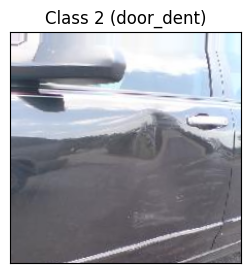

In [29]:
images, labels = next(train_gen)
check_one(images, np.argmax(labels, axis=1))

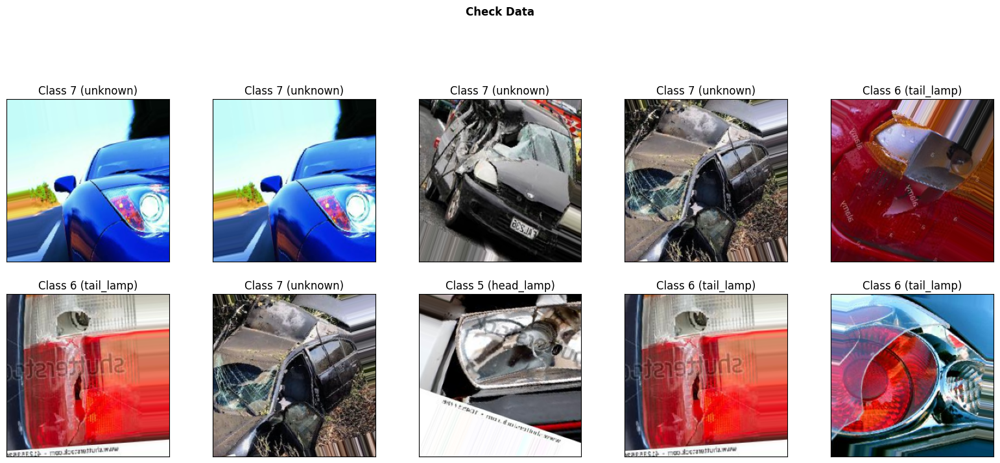

In [30]:
check_ten(images, np.argmax(labels, axis=1))

##Prepare data

In [31]:
num_classes = len(labels[0])
print(labels[0])
print(num_classes)

[0. 0. 0. 0. 0. 0. 1. 0.]
8


##Create the model's architecture

In [32]:
model = Sequential()

In [33]:
model.add(Conv2D(48, kernel_size = 3, activation = 'relu', padding = 'same', input_shape = (224, 224, 3)))
model.add(Conv2D(48, kernel_size = 3, activation = 'relu'))
model.add(MaxPool2D(pool_size = (2, 2)))
model.add(Dropout(0.25))
model.add(Conv2D(96, kernel_size = 3, activation = 'relu', padding = 'same'))
model.add(Conv2D(96, kernel_size = 3, activation = 'relu'))
model.add(MaxPool2D(pool_size = (2, 2)))
model.add(Dropout(0.25))
model.add(Conv2D(192, kernel_size = 3, activation = 'relu', padding = 'same'))
model.add(Conv2D(192, kernel_size = 3, activation = 'relu'))
model.add(MaxPool2D(pool_size = (2, 2)))
model.add(Dropout(0.25))
model.add(Flatten())
model.add(Dense(512, activation = 'relu'))
model.add(Dropout(0.5))
model.add(Dense(256, activation = 'relu'))
model.add(Dropout(0.5))
model.add(Dense(num_classes, activation = 'softmax'))

In [34]:
print(model.summary())

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 224, 224, 48)   │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 222, 222, 48)   │        20,784 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 111, 111, 48)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 111, 111, 48)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 111, 111, 96)   │        41,568 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 109, 109, 96)   │        83,040 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 54, 54, 96)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 54, 54, 96)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 54, 54, 192)    │       166,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 52, 52, 192)    │       331,968 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 26, 26, 192)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 26, 26, 192)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 129792)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │    66,454,016 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 8)              │         2,056 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 67,232,184 (256.47 MB)

 Trainable params: 67,232,184 (256.47 MB)

 Non-trainable params: 0 (0.00 B)

None


## Compile the model

In [35]:
# insert code here
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

## Fit the training data

In [36]:
log_dir = 'logs'

if not os.path.exists(log_dir):
  os.makedirs(log_dir)

In [37]:
# Uncomment the statement below to allow online monitoring with TensorBoard
tensorboard = TensorBoard(log_dir = 'logs') # choose or create a directory for the logs

In [38]:
%%time
# insert code here
# Fit the model on a training set
history = model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=100,
    batch_size=100,
    callbacks = [tensorboard],
    verbose=1)
print(f'Training accuracy:{history.history["accuracy"][-1]:.2f} validation accuracy:{history.history["val_accuracy"][-1]:.2f}')

Epoch 1/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 42s 897ms/step - accuracy: 0.3031 - loss: 2.1648 - val_accuracy: 0.3725 - val_loss: 1.8863
Epoch 2/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 34s 846ms/step - accuracy: 0.3412 - loss: 1.9032 - val_accuracy: 0.3725 - val_loss: 1.7507
Epoch 3/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 41s 839ms/step - accuracy: 0.3586 - loss: 1.8152 - val_accuracy: 0.3725 - val_loss: 1.9295
Epoch 4/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 42s 873ms/step - accuracy: 0.3227 - loss: 1.8729 - val_accuracy: 0.3725 - val_loss: 1.8135
Epoch 5/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 35s 876ms/step - accuracy: 0.3490 - loss: 1.8822 - val_accuracy: 0.3725 - val_loss: 1.7813
Epoch 6/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 40s 872ms/step - accuracy: 0.3343 - loss: 1.8062 - val_accuracy: 0.3725 - val_loss: 1.7022
Epoch 7/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 41s 884ms/step - accuracy: 0.3575 - loss: 1.7806 - val_accuracy: 0.3922 - val_loss: 1.6759
Epoch 8/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 33s 836ms/step - accuracy: 0.3890 - loss: 1.7611 - 

### TensorBoard
- TensorBoard is TensorFlow's visualisation toolkit.
- If Tensorflow 2 and Jupyter is installed in the same environment, running the cell below will start TensorBoard within the notebook.
- More information about how to set up TensorBoard can be found [here](https://www.tensorflow.org/tensorboard/tensorboard_in_notebooks)


In [39]:
%load_ext tensorboard
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

In [ ]:
# Uncomment and run the code below if unable to visualise TensorBoard a second time.
#%reload_ext tensorboard
#%tensorboard --logdir logs --port=6007

## Create predictions

In [40]:
predictions = model.predict(test_gen)

10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 104ms/step


In [41]:
print(type(predictions))
print(predictions)

<class 'numpy.ndarray'>
[[3.1398755e-02 7.1047083e-02 2.0021184e-01 ... 1.1626414e-01
  1.5401884e-02 1.6253017e-01]
 [5.6340676e-02 1.8764192e-01 2.7879801e-01 ... 2.6573062e-02
  9.3318084e-03 4.3969132e-02]
 [8.4776811e-02 2.1677218e-01 2.4790643e-01 ... 2.8569806e-02
  2.0132814e-02 5.3766407e-02]
 ...
 [2.6646212e-01 3.3494923e-01 1.1120412e-01 ... 4.9771920e-02
  3.4321163e-02 1.1318995e-01]
 [1.9094972e-04 1.1985634e-02 2.8467467e-03 ... 2.1698256e-01
  1.9091877e-04 2.1876778e-02]
 [2.2163384e-02 4.0498532e-02 5.2093250e-01 ... 3.3499734e-04
  4.1062586e-04 1.6070949e-02]]


## Evaluate the model

In [42]:
score = model.evaluate(test_gen)
print('\nTest loss: %.6f, Test_accuracy: %.6f' % tuple(score))

10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - accuracy: 0.5689 - loss: 1.2073

Test loss: 1.154232, Test_accuracy: 0.605016


In [43]:
def print_cm(cm):
    d_size = max(len('%d' % cm.max()), len('%d' % cm.shape[1]))
    if min(cm.shape) > 10: # make sparse
        print('Sparse Matrix (*=diagonal)')
        fmt_r = '%%0%dd:' % d_size
        fmt_c = ', c%%0%dd%%s= %%%dd' % (d_size, d_size)
        for i in range(cm.shape[0]):
            s = fmt_r % i
            for j in range(cm.shape[1]):
                if cm[i, j] > 0:
                    s += fmt_c % (j, '*' if i == j else ' ', cm[i, j])
            print(s)
    else: # make dense
        c = '%%%dd ' % d_size
        s = '%s| ' % (' ' * d_size)
        s += ''.join([c % i for i in range(len(cm[0]))])
        print(s)
        print('-' * len(s))
        for i, r in enumerate(cm):
            s = '%%%dd| ' % d_size
            s = s % i
            s += c * len(r)
            print(s % tuple(r))

In [44]:
# Convert predicted probabilities to class labels
predictions_class = np.argmax(predictions, axis=1)

# Convert test_gen to class indices for comparison with predictions
y_test_target = test_gen.labels

# Now use these class labels to compute the confusion matrix
cm = confusion_matrix(y_test_target, predictions_class)
print(cm)

[[ 8 10  4  1  2  0  3  1]
 [ 2 13  2  2  7  0  0  2]
 [ 2  4 20  5  3  1  0  4]
 [ 5  0 12 11  0  0  2  2]
 [ 0  1  1  0 21  0  1  2]
 [ 0  1  0  0  4 15  0  3]
 [ 1  2  3  0  1  4 20  2]
 [ 0  1  6  2 11  1  3 85]]


In [45]:
print(type(y_test_target), type(predictions_class))
print(len(y_test_target), len(predictions_class))
print(predictions_class)

<class 'list'> <class 'numpy.ndarray'>
319 319
[4 3 3 1 2 7 1 7 7 0 1 2 7 1 7 7 2 4 1 7 3 3 4 2 3 1 0 2 7 7 0 7 7 1 2 2 4
 7 7 1 7 1 7 2 7 7 5 4 7 5 0 7 7 7 0 6 7 3 4 7 5 7 4 4 6 4 2 6 5 2 3 7 0 7
 0 7 2 1 5 1 7 2 4 7 0 7 7 6 7 7 7 7 1 7 7 4 7 7 2 7 3 4 0 4 1 6 2 6 4 7 7
 4 6 6 2 7 7 2 7 1 3 5 2 2 4 7 4 7 6 2 3 7 3 2 7 5 2 4 3 4 0 4 0 6 4 4 4 2
 7 7 4 4 2 1 0 7 4 7 6 6 7 1 6 2 1 5 2 6 2 5 1 4 7 2 6 7 6 2 6 0 6 5 5 4 4
 3 2 7 2 0 4 5 4 4 3 2 7 4 2 2 5 1 7 4 7 7 7 3 5 7 5 6 0 7 7 5 4 4 7 7 7 2
 2 7 7 2 7 5 1 7 6 4 1 2 7 7 7 5 7 2 1 7 2 7 1 7 7 2 4 6 7 4 6 2 0 7 7 4 7
 7 4 7 7 3 3 7 6 7 7 6 6 7 2 0 2 4 2 7 7 7 4 1 5 5 2 7 7 1 4 4 2 3 3 6 6 1
 7 7 7 1 4 3 5 4 6 2 7 4 0 1 6 3 1 1 7 1 1 4 2]


In [46]:
# When you run the code below, it will display a list of available keys. These keys correspond to the recorded metrics during training.

print(history.history.keys())

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])


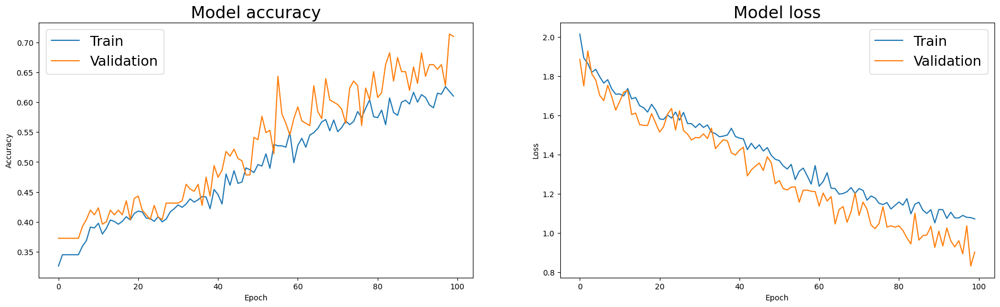

In [47]:
fig, ax = plt.subplots(1, 2, figsize = (18, 6))
fig.subplots_adjust(left = 0.02, right = 0.98, wspace = 0.2)

plt.rcParams.update({'font.size': 18})

# Plot training & validation accuracy values
ax[0].plot(history.history['accuracy'])
ax[0].plot(history.history['val_accuracy'])
ax[0].set_title('Model accuracy')
ax[0].set_ylabel('Accuracy')
ax[0].set_xlabel('Epoch')
ax[0].legend(['Train', 'Validation'])

# Plot training & validation loss values
ax[1].plot(history.history['loss'])
ax[1].plot(history.history['val_loss'])
ax[1].set_title('Model loss')
ax[1].set_ylabel('Loss')
ax[1].set_xlabel('Epoch')
ax[1].legend(['Train', 'Validation'])

plt.show()

## Results

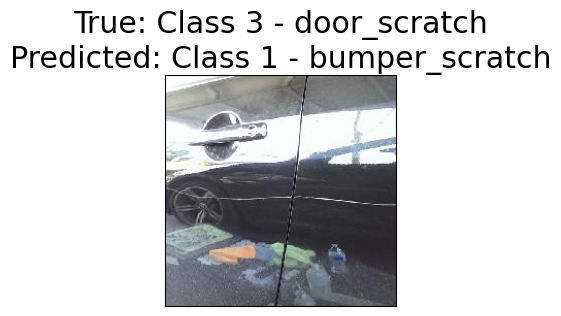

In [48]:
images, labels = next(test_gen)
check_one(images, predictions_class, actual=labels, compare = True)

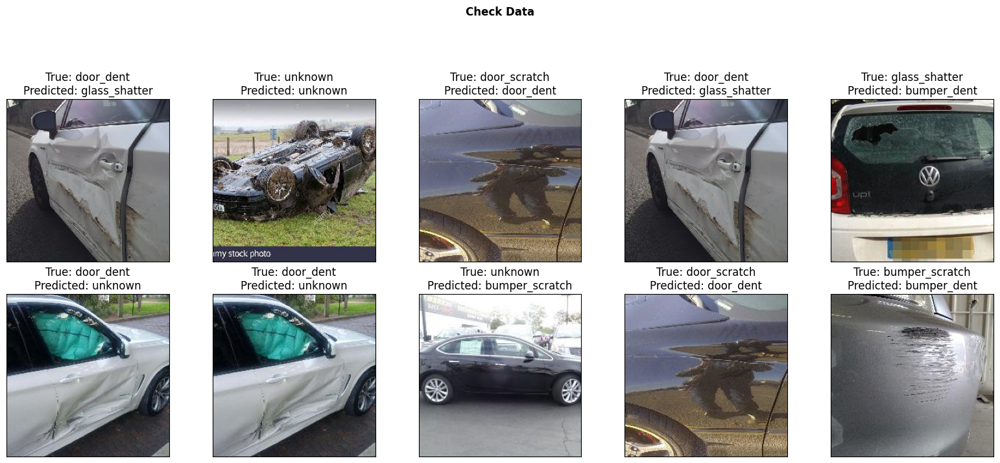

In [49]:
check_ten(images, predictions_class, labels, True)

## Save models and weights

In [50]:
# # save model and weights
model_json = model.to_json()
with open('CNN_model.json', 'w') as json_file:
     json_file.write(model_json)
# # save weights
model.save_weights('CNN_model.weights.h5')



---



---



> > > > > > > > > © 2025 Institute of Data


---



---



